## Donkey Lane Finder


In [1]:
import cv2
# import matplotlib
# matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
# plt.switch_backend('TkAgg')
import matplotlib.image as mpimg
import numpy as np
import glob
import pickle

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from IPython.display import display
%matplotlib inline

In [3]:
# img = cv2.imread('camera_cal/calibration1.jpg') # BGR Image
# plt.imshow(img)

Looks good. Lets try on a image of a road.(Test Images)

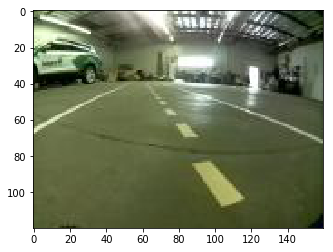

In [6]:
# Load Test Images
file_names = glob.glob('/home/kks/Documents/Donkey_cv/tub_2_18-06-07/*_cam-image_array_.jpg')
# img = cv2.imread('/home/kks/Documents/Donkey_cv/tub_2_18-06-07/1_cam-image_array_.jpg') # bgr
img = img[:,:,::-1]
plt.imshow(img)
# # To interchange red and blue in an image
# undistorted = undistorted[:,:,::-1]
# img = img[:,:,::-1]
# # cv2.imwrite('test_images/exp_output/thresholded/test1ifred.jpg',undistorted)
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
# fig.tight_layout()
# ax1.imshow(img)
# ax1.set_title('Distorted Image', fontsize=25)
# ax2.imshow(undistorted)
# ax2.set_title('Corrected Image', fontsize=25)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.1,hspace = 0.5)
# plt.show()
# fig.savefig("output_images/dist_test.jpg")

# undistorted = cv2.undistort(img, mtx, dist, None, mtx) # bgr image


Lets apply color and gradient thresholds.

# Color and Gradient Thresholds

Using different color schemes and specific information on the gradients, we can identify the lane features better.


I used an interactive plotter to tune the thresholds.

## Experimentation with Gradient Thresholds

In [6]:
def grad_threshold(img,kernel_size=9,grad_thresholds=(0, 255,-np.pi*0.5,np.pi*0.5)):
        # Read in the saved objpoints and imgpoints
        dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ))
        mtx=dist_pickle["mtx"]
        dist=dist_pickle["dist"]
        undistorted_img_bgr = cv2.undistort(img, mtx, dist, None, mtx) # bgr image

        # Initialize gradient channels
        gray = cv2.cvtColor(undistorted_img_bgr, cv2.COLOR_BGR2GRAY)
        
#         # Final selected thresholds
#         kernel_size = 17
#         grad_x_min = 24
#         grad_x_max =205
#         dir_min = 0.63
#         dir_max = 1.53

        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=kernel_size)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=kernel_size)
        abs_sobx = np.absolute(sobelx)
        abs_soby= np.absolute(sobely)
        dir_sob= np.arctan2(abs_soby, abs_sobx)

        # Apply thresholds for absolute sobelx, sobely and direction
        scaled_sobel_x = np.uint8(255*abs_sobx/np.max(abs_sobx))
        grad_x_bin = np.zeros_like(scaled_sobel_x)
        grad_x_bin[(scaled_sobel_x >= grad_thresholds[0]) & (scaled_sobel_x <= grad_thresholds[1])] = 1

#         scaled_sobel_y = np.uint8(255*abs_soby/np.max(abs_soby))
#         grad_y_bin = np.zeros_like(scaled_sobel_y)
#         grad_y_bin[(scaled_sobel_y >= grad_thresholds[0]) & (scaled_sobel_y <= grad_thresholds[1])] = 1

        dir_bin = np.zeros_like(dir_sob)
        dir_bin[(dir_sob >= grad_thresholds[2]) & (dir_sob <= grad_thresholds[3])] = 1

        # Combining the different gradients
        combined_grad = np.zeros_like(grad_x_bin)
        combined_grad[(grad_x_bin==1)&(dir_bin==1)]=1
        
        return combined_grad

# def grad_images_plotter(kernel_size,min_x=(0,255),
#                  max_x=(0,255),min_ang=(-np.pi*0.5,np.pi*0.5),max_ang=(-np.pi*0.5,np.pi*0.5)):
    
#     images1 = glob.glob('test_images/exp_output/undistorted/straight_lines*.jpg')
#     for index,file_name in enumerate(images1):
# #         if index==0:
#             img1 = cv2.imread(file_name)
#             title = file_name.split('/')
#             title = title[-1]
#             f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
#             f.tight_layout()
#             img1=img1[:,:,::-1] # for matplotlib display we need rgb
#             ax1.imshow(img1)
#             ax1.set_title(title, fontsize=30)
#             img2 = grad_threshold(img1,kernel_size,grad_thresholds=(min_x,max_x,min_ang,max_ang))
#             ax2.imshow(img2,cmap='gray') # for matplotlib display we need rgb
#             ax2.set_title("gradient_thresholded", fontsize=30)
#             plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
#             plt.show()
    
#     images2 = glob.glob('test_images/exp_output/undistorted/test*.jpg')
#     for index,file_name in enumerate(images2):
#         if index==1:
            
#             img1 = cv2.imread(file_name)
#             title = file_name.split('/')
#             title = title[-1]
#             f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
#             f.tight_layout()
#             img1=img1[:,:,::-1] # for matplotlib display we need rgb
#             ax1.imshow(img1)
#             ax1.set_title(title, fontsize=30)
#             img2 = grad_threshold(img1,kernel_size,grad_thresholds=(min_x,max_x,min_ang,max_ang))
#             ax2.imshow(img2,cmap='gray') # for matplotlib display we need rgb
#             ax2.set_title("gradient_thresholded", fontsize=30)
#             plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
#             plt.show()


In [7]:
def grad_plotter():
    img1 = cv2.imread(file_name)
    title = file_name.split('/')
    title = title[-1]
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    img1=img1[:,:,::-1] # for matplotlib display we need rgb
    ax1.imshow(img1)
    ax1.set_title(title, fontsize=30)
    img2 = grad_threshold(img1,17,grad_thresholds=(23,205,0.63,np.pi/2))
    ax2.imshow(img2,cmap='gray') # for matplotlib display we need rgb
    ax2.set_title("gradient_thresholded", fontsize=30)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    plt.show()



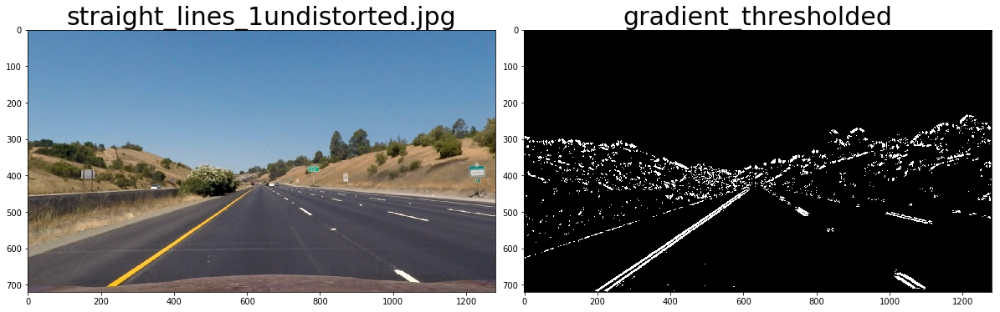

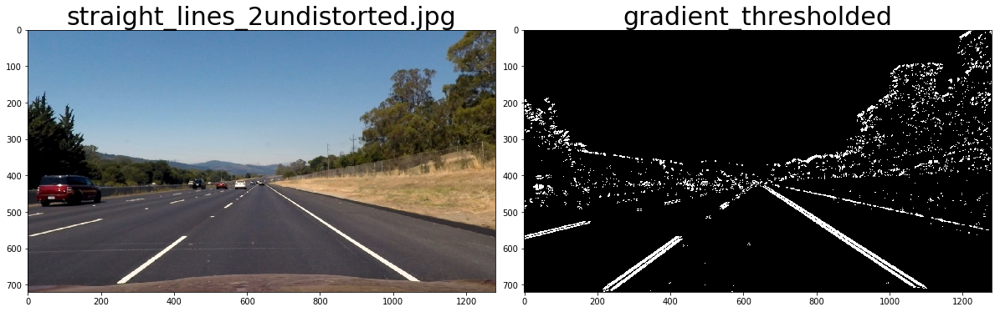

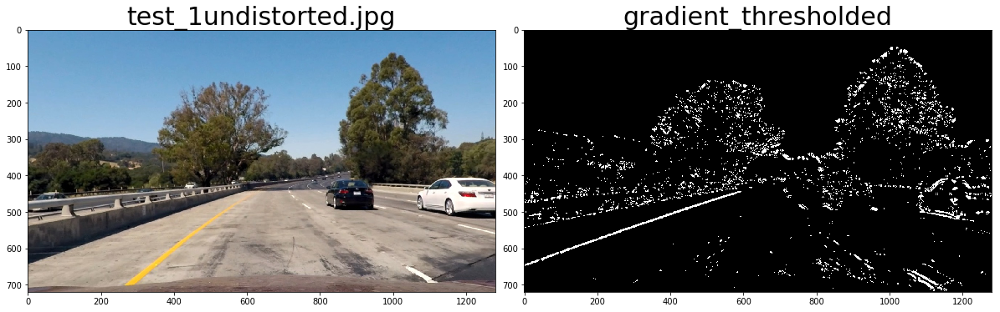

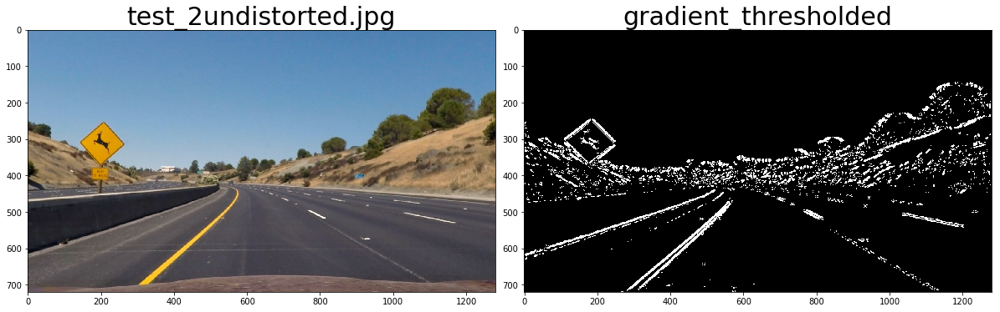

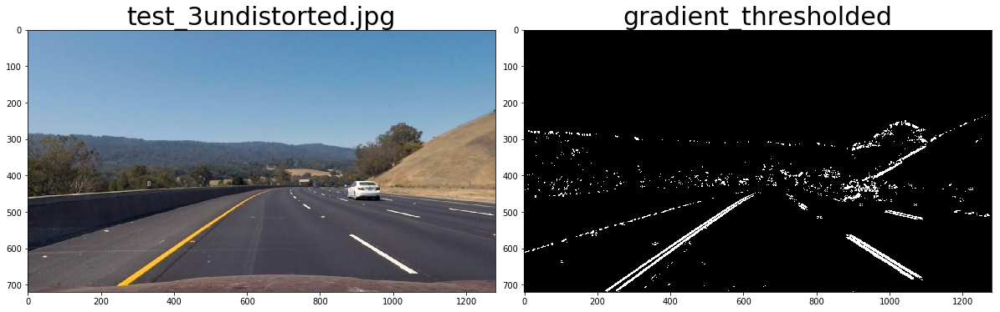

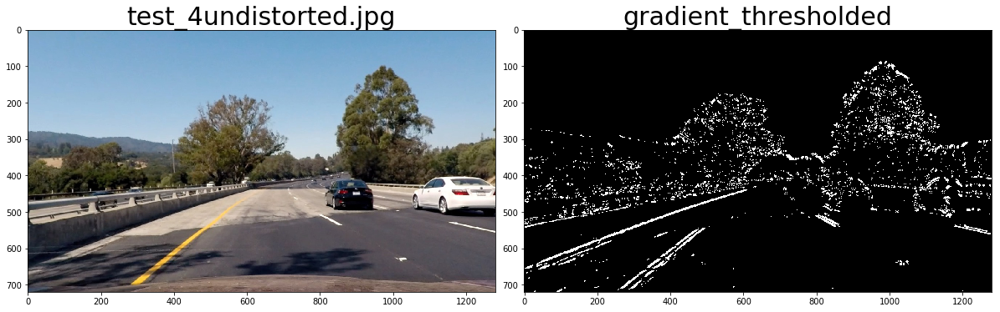

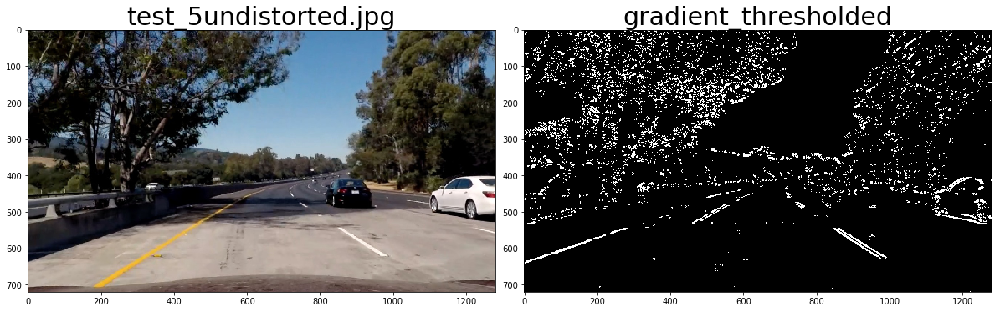

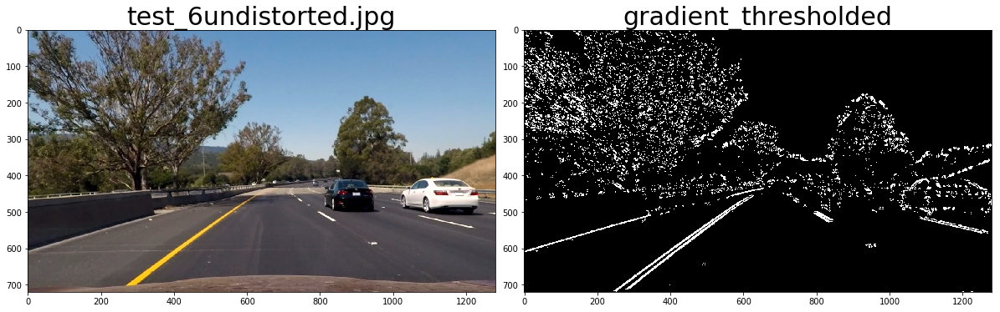

In [8]:
# interact(grad_images_plotter,kernel_size=(1,31,2),min_x=(0,255),
#                  max_x=(0,255),min_ang=(-np.pi*0.5,np.pi*0.5),max_ang=(-np.pi*0.5,np.pi*0.5))

images1 = glob.glob('test_images/exp_output/undistorted/straight_lines*.jpg')
for index,file_name in enumerate(images1):
#         if index==0:
        grad_plotter()

images2 = glob.glob('test_images/exp_output/undistorted/test*.jpg')
for index,file_name in enumerate(images2):
        grad_plotter()

We can observe that the Shadows make it difficult to detect the gradients in test1,test4,and test5 images. The correction can be made by combining the color thresholds with the gradient thresholds.

## Experimentation with Color Thresholds

In [9]:
def color_threshold(img,color_thresholds):
        # Read in the saved objpoints and imgpoints
        dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ))
        mtx=dist_pickle["mtx"]
        dist=dist_pickle["dist"]
        undistorted_img_bgr = cv2.undistort(img, mtx, dist, None, mtx) # bgr image

        # Initialize color channels    
        hls = cv2.cvtColor(undistorted_img_bgr, cv2.COLOR_BGR2HLS)
        hsv = cv2.cvtColor(undistorted_img_bgr, cv2.COLOR_BGR2HSV)
        l_channel = hls[:,:,1]
        s_channel = hls[:,:,2]
        v_channel = hsv[:,:,2]
        r_channel = undistorted_img_bgr[:,:,2]
        g_channel = undistorted_img_bgr[:,:,1]

        # Threshold color channel
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_channel >= color_thresholds[0]) & (s_channel <= color_thresholds[1])] = 1
        l_binary = np.zeros_like(l_channel)
        l_binary[(l_channel >= color_thresholds[2]) & (l_channel <=color_thresholds[3])] = 1
        v_binary= np.zeros_like(v_channel)
        v_binary[(v_channel >= color_thresholds[4])&(v_channel<=color_thresholds[5])] = 1
        r_binary= np.zeros_like(r_channel)
        r_binary[(r_channel >= color_thresholds[6])&(r_channel<=color_thresholds[7])] = 1
        g_binary= np.zeros_like(r_channel)
        g_binary[(g_channel >= color_thresholds[8])&(g_channel<=color_thresholds[9])] = 1

        yellow_rec = np.zeros_like(s_binary)
        yellow_rec[((r_binary==1)&(g_binary==1))|(s_binary==1)]=1
        
        finalcolor_combined = np.zeros_like(yellow_rec)
        finalcolor_combined[(yellow_rec==1) & (l_binary==1)]=1
        
        return finalcolor_combined

def color_images_plotter(s_min=(0,255),s_max=(0,255),l_min=(0,255),l_max=(0,255),v_min=(0,255),v_max=(0,255),
                         r_min=(0,255),r_max=(0,255),g_min=(0,255),g_max=(0,255)):
    
#     images1 = glob.glob('test_images/exp_output/undistorted/straight_lines*.jpg')
#     for index,file_name in enumerate(images1):
#         if index==1:
#             img1 = cv2.imread(file_name)
#             title = file_name.split('/')
#             title = title[-1]
#             f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
#             f.tight_layout()
#             img1=img1[:,:,::-1] # for matplotlib display we need rgb
#             ax1.imshow(img1)
#             ax1.set_title(title, fontsize=30)
#             img2 = color_threshold(img1,color_thresholds=(s_min,s_max,l_min,l_max,v_min,v_max,
#                          r_min,r_max,g_min,g_max))
#             ax2.imshow(img2,cmap='gray') # for matplotlib display we need rgb
#             ax2.set_title("gradient_thresholded", fontsize=30)
#             plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
#             plt.show()
    
#     images2 = glob.glob('test_images/exp_output/undistorted/test*.jpg')
#     for index,file_name in enumerate(images2):
    file_names=["test_images/exp_output/undistorted/test_1undistorted.jpg",
                        "test_images/exp_output/undistorted/test_4undistorted.jpg",
                        "test_images/exp_output/undistorted/test_5undistorted.jpg"]
    for file_name in file_names:
            img1 = cv2.imread(file_name)
            title = file_name.split('/')
            title = title[-1]
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
            f.tight_layout()
            img1=img1[:,:,::-1] # for matplotlib display we need rgb
            ax1.imshow(img1)
            ax1.set_title(title, fontsize=30)
            img2 = color_threshold(img1,color_thresholds=(s_min,s_max,l_min,l_max,v_min,v_max,
                          r_min,r_max,g_min,g_max))
            ax2.imshow(img2,cmap='gray') # for matplotlib display we need rgb
            ax2.set_title("color_thresholded", fontsize=30)
            plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
            plt.show()

In [10]:
def plt_images():
    img1 = cv2.imread(file_name)
    title = file_name.split('/')
    title = title[-1]
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    img1=img1[:,:,::-1] # for matplotlib display we need rgb
    ax1.imshow(img1)
    ax1.set_title(title, fontsize=30)
    img2 = color_threshold(img1,color_thresholds=(80,255,125,255,160,255,
                 200,255,200,255))
    ax2.imshow(img2,cmap='gray') # for matplotlib display we need rgb
    ax2.set_title("color_thresholded", fontsize=30)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    plt.show()


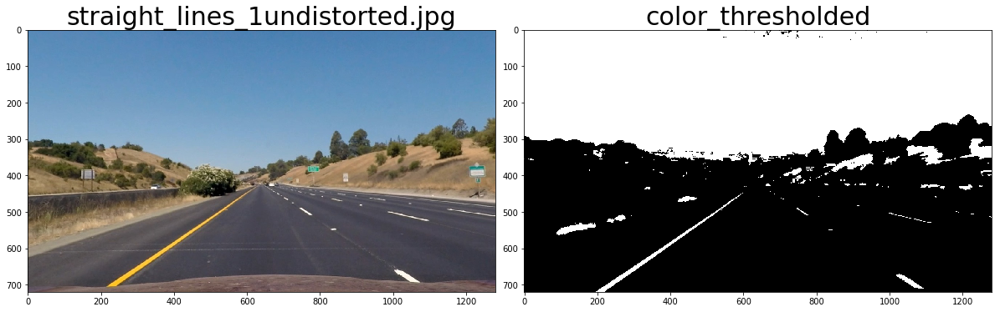

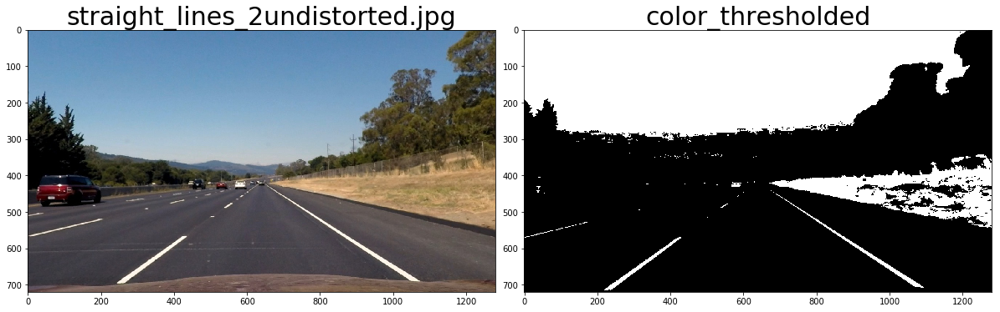

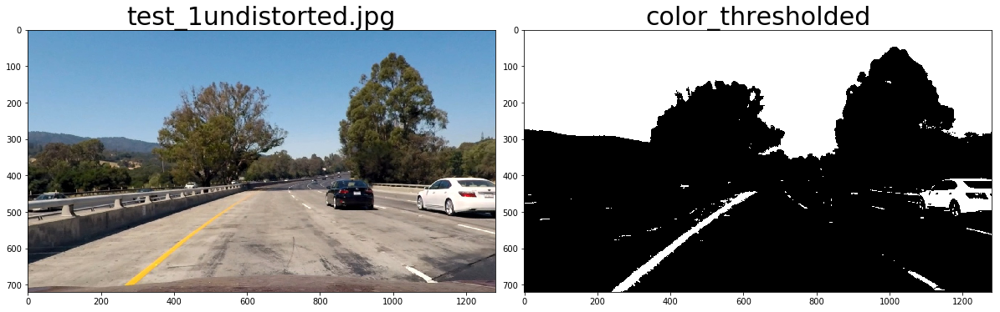

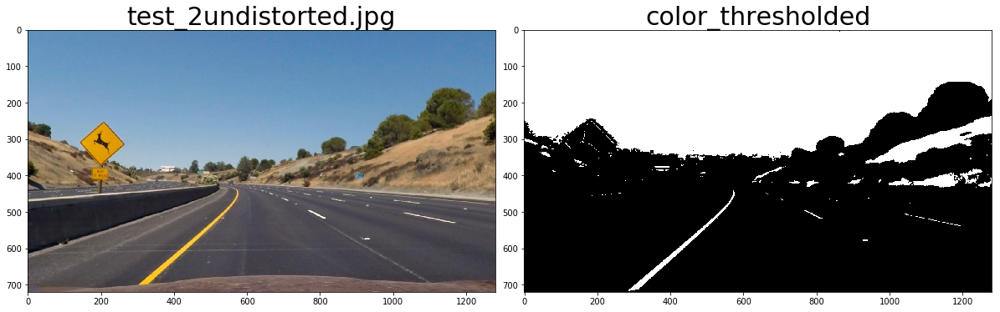

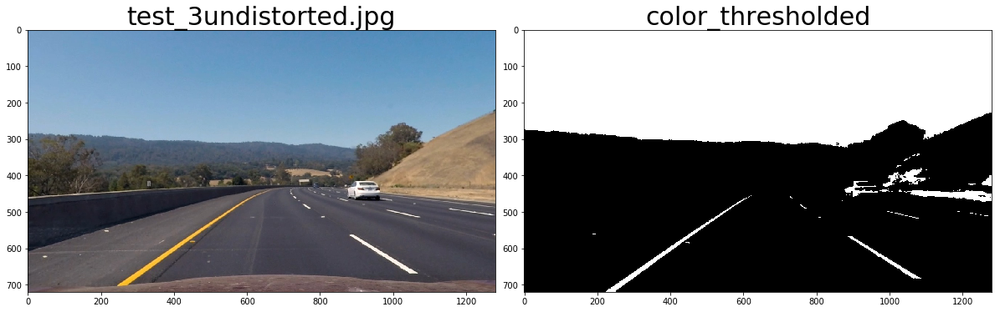

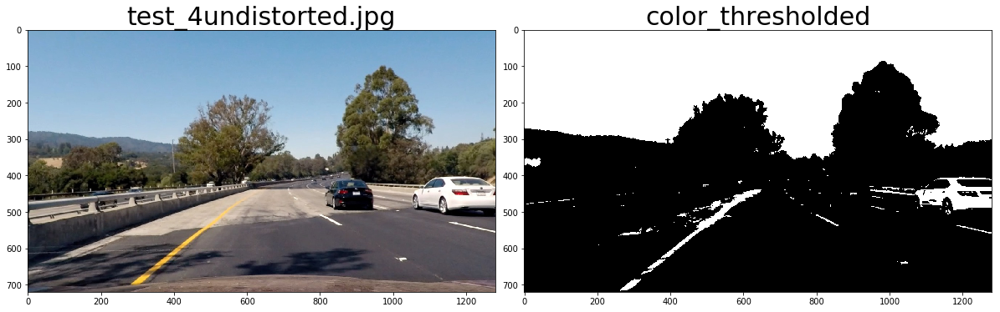

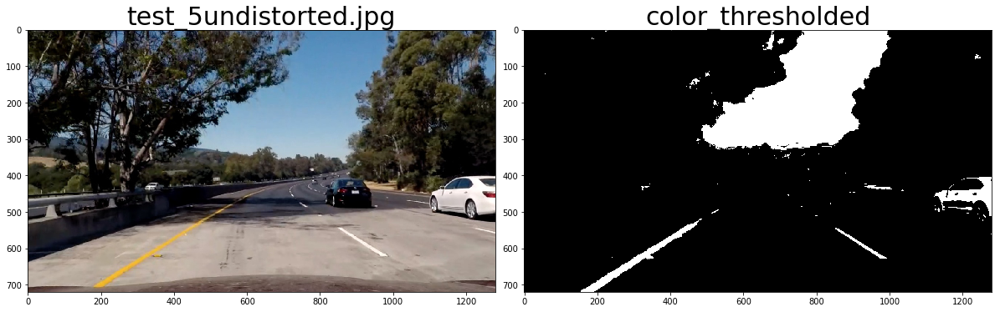

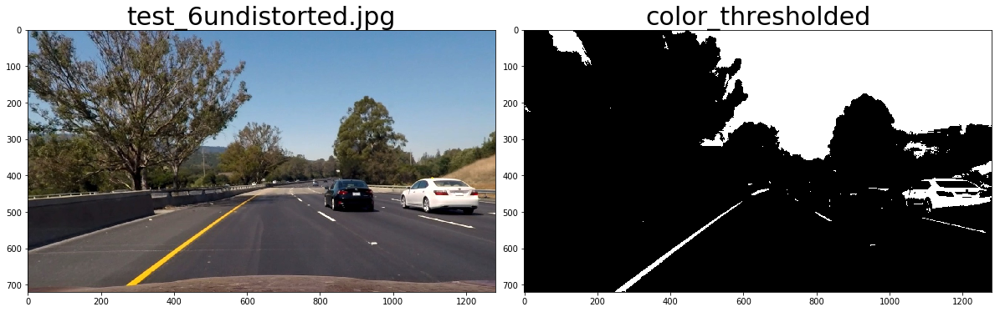

In [11]:
# interact(color_images_plotter,s_min=(80,80),s_max=(255,255),l_min=(0,255),l_max=(0,255),v_min=(160,160),v_max=(255,255),
#                          r_min=(200,200),r_max=(255,255),g_min=(200,200),g_max=(255,255))
images1 = glob.glob('test_images/exp_output/undistorted/straight_lines*.jpg')
for index,file_name in enumerate(images1):
        plt_images()
images2 = glob.glob('test_images/exp_output/undistorted/test*.jpg')
for index,file_name in enumerate(images2):
        plt_images()


Combined Gradient and Color Thresholds

In [12]:
def combined_plotter():
    img1 = cv2.imread(file_name)
    title = file_name.split('/')
    title = title[-1]
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    img1=img1[:,:,::-1] # for matplotlib display we need rgb
    ax1.imshow(img1)
    ax1.set_title(title, fontsize=30)
    g_img = grad_threshold(img1,17,grad_thresholds=(23,205,0.63,np.pi/2))
    c_img = color_threshold(img1,color_thresholds=(80,255,145,255,0,255,
                 200,255,200,255))
    combined = np.zeros_like(g_img)
    combined[(g_img==1)|(c_img==1)]=1
    ax2.imshow(combined,cmap='gray') # for matplotlib display we need rgb
    ax2.set_title("combined_thresholded", fontsize=30)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    plt.show()
#     f.savefig("output_images/perspective"+title+".jpg")

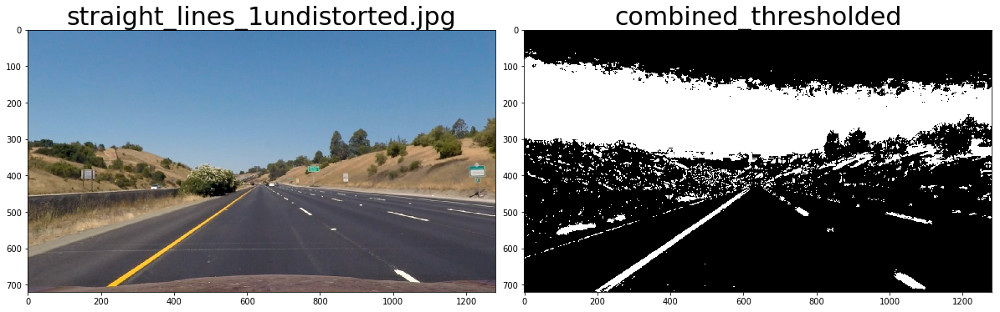

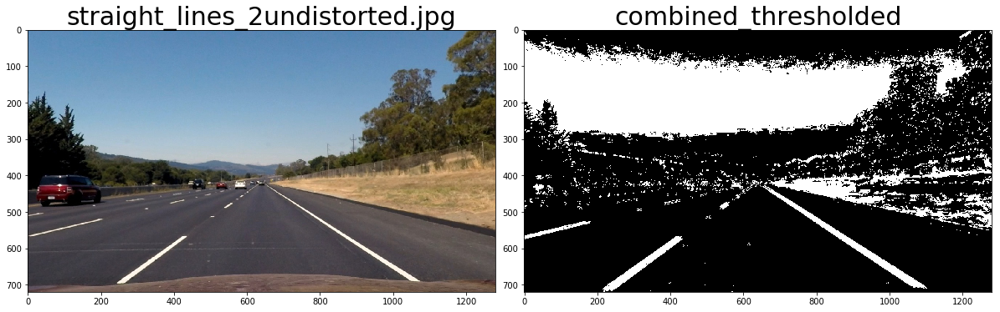

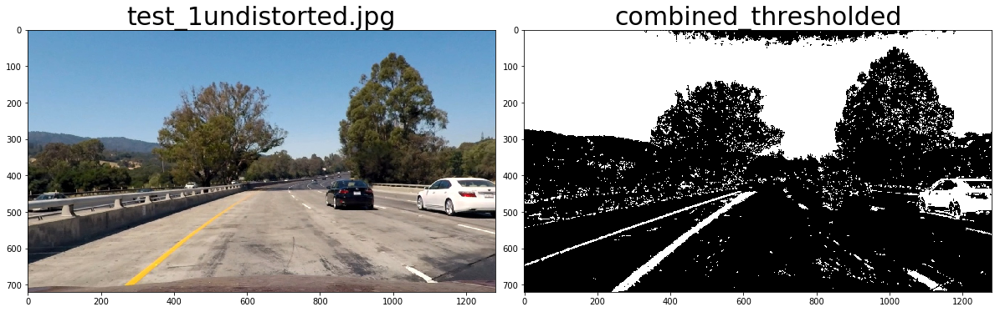

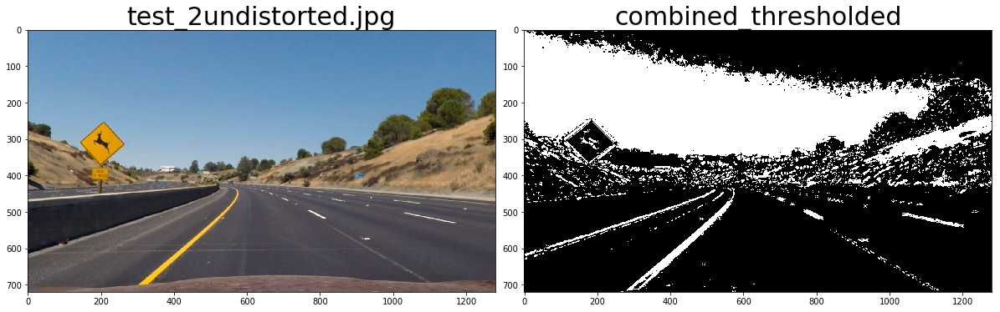

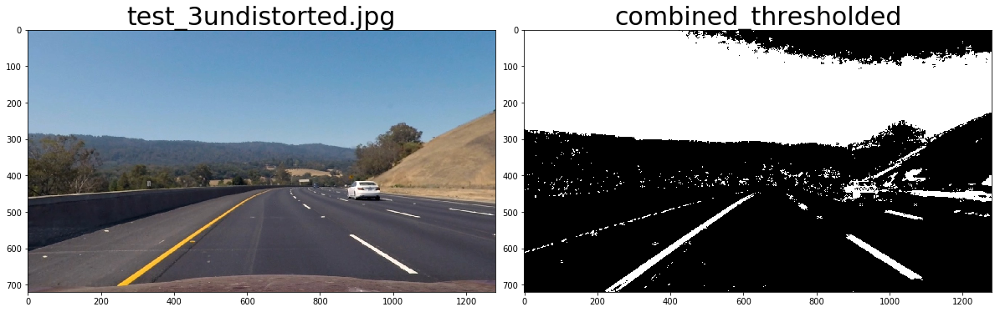

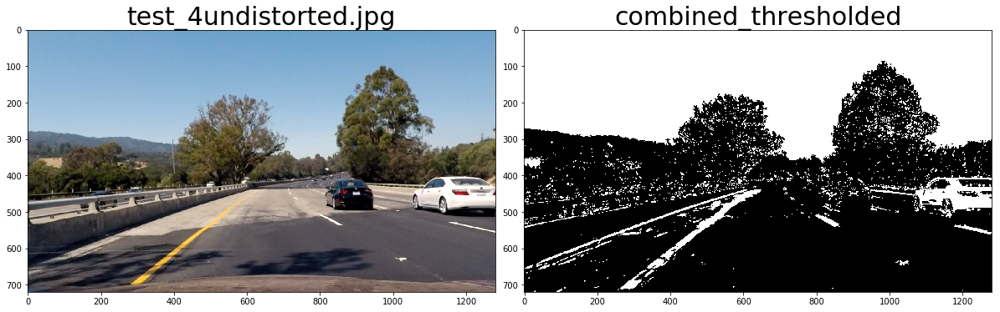

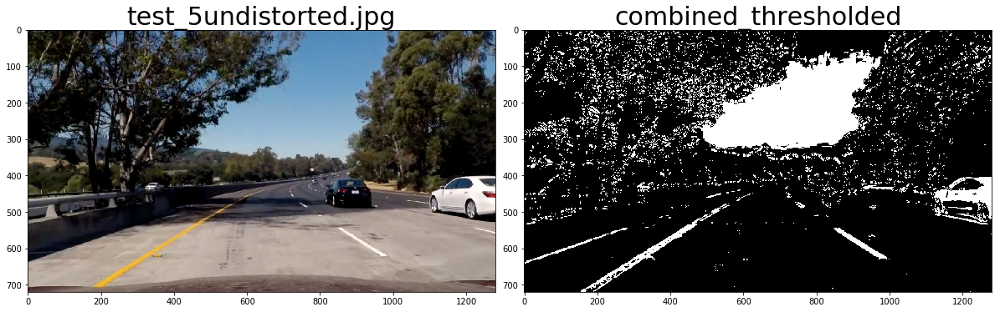

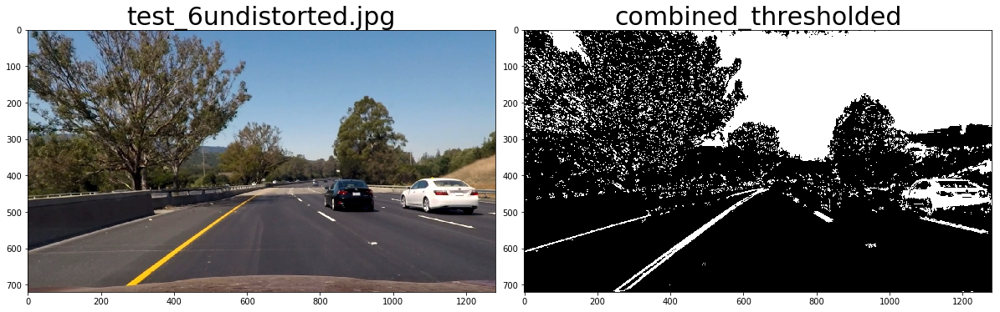

In [13]:
images1 = glob.glob('test_images/exp_output/undistorted/straight_lines*.jpg')
for index,file_name in enumerate(images1):
    combined_plotter()
images2 = glob.glob('test_images/exp_output/undistorted/test*.jpg')
for index,file_name in enumerate(images2):
# file_names=["test_images/exp_output/undistorted/test_1undistorted.jpg",
#                     "test_images/exp_output/undistorted/test_4undistorted.jpg",
#                     "test_images/exp_output/undistorted/test_5undistorted.jpg"]
# for file_name in file_names:
    combined_plotter()

    
    


# Perspective Transform
Apply a region of interest and transform the image so that lanes lines appear parallel.

In [14]:
def transform(img):

    # define source and destination points for transform
    src = np.float32([[480, 480],[800, 480],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[50, 720]])
    img_size = (img.shape[1],img.shape[0])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped,M_inv

# Apply the threshold on the transformed image

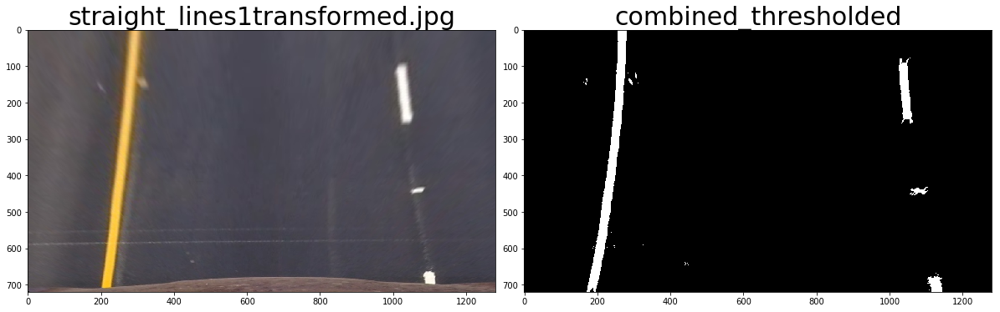

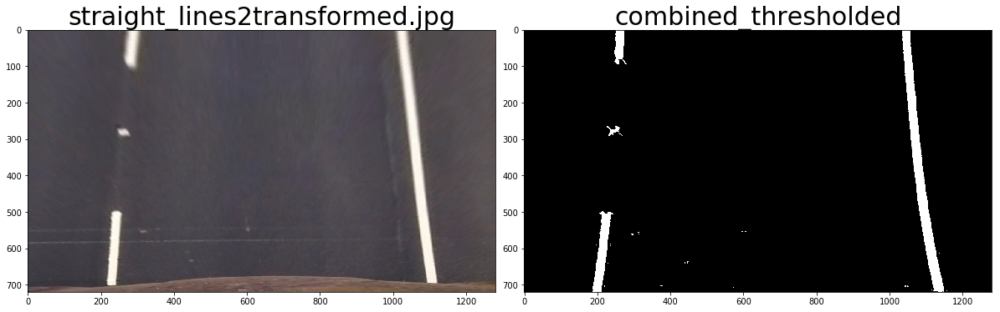

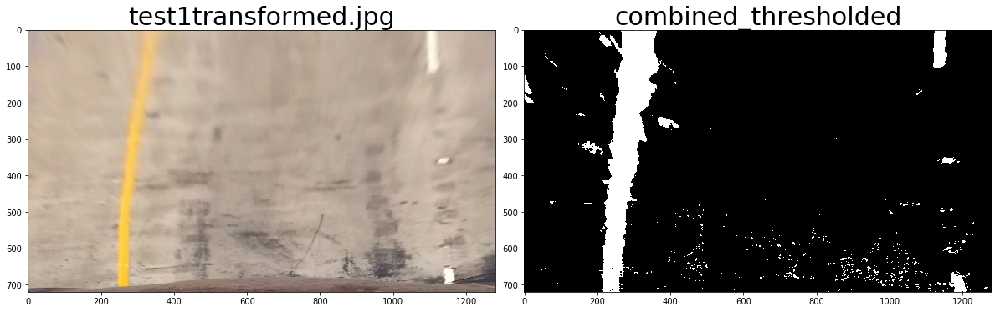

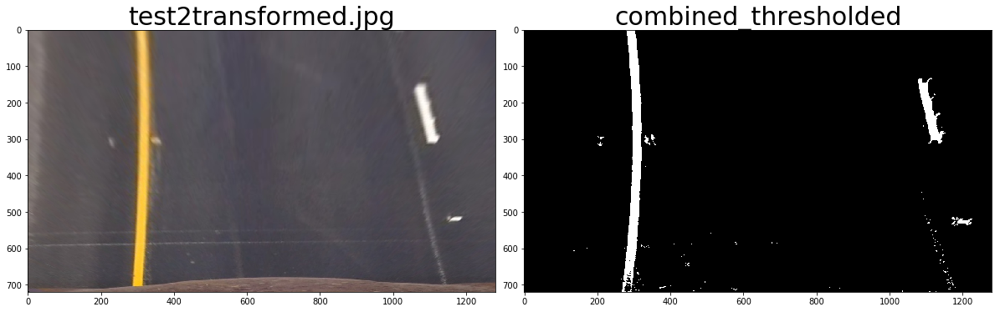

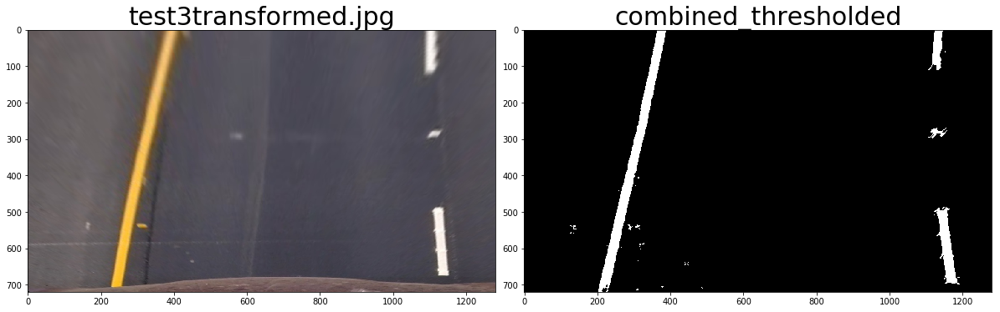

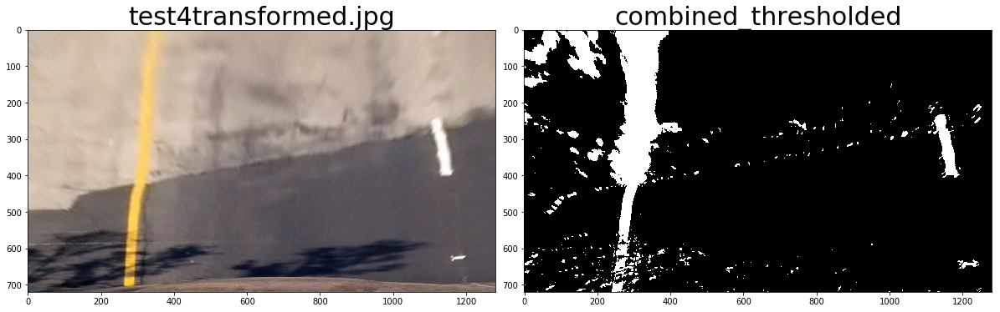

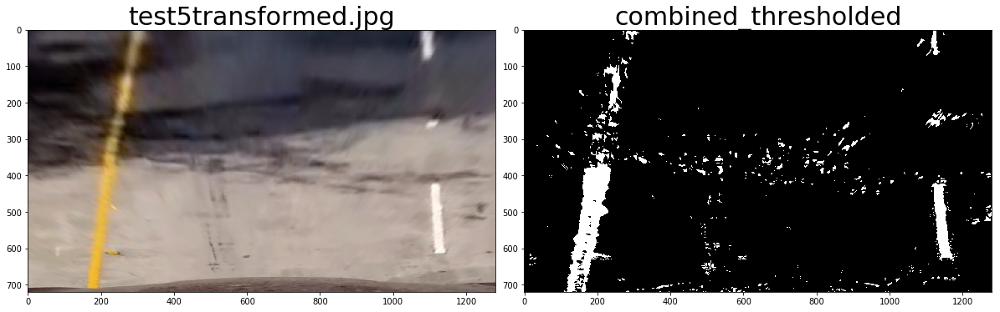

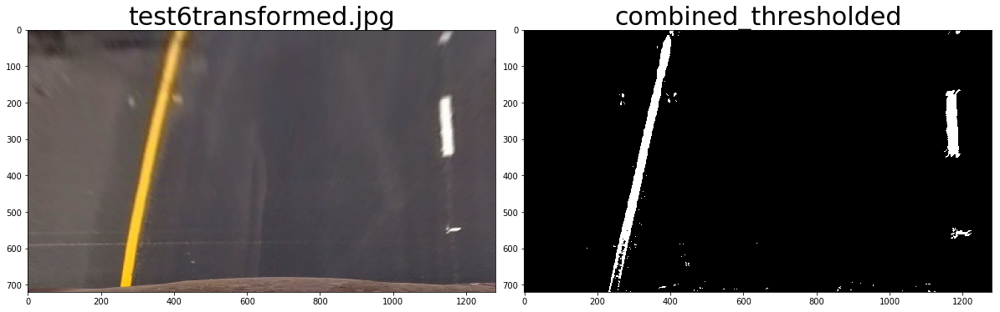

In [15]:
images1 = glob.glob('test_images/exp_output/perspective/straight_lines*.jpg')
for index,file_name in enumerate(images1):
        combined_plotter()

images2 = glob.glob('test_images/exp_output/perspective/test*.jpg')
for index,file_name in enumerate(images2):
        combined_plotter()

# Assembling the preprocessing function for detecting lane pixels and boundary

In [16]:
# Preprocessing pipeline
def preprocess(img):
    
    # undistort the image
    # Read in the saved objpoints and imgpoints
    dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ))
    mtx=dist_pickle["mtx"]
    dist=dist_pickle["dist"]
    undistorted_img_bgr = cv2.undistort(img, mtx, dist, None, mtx) # bgr image
    
    # Apply gradient and color thresholds
    # Initialize the gradient parameters tuned
    kernel_size=11
    grad_thresholds=[100,255,-0.5,1.5]
    # Initialize gradient channels
    gray = cv2.cvtColor(undistorted_img_bgr, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=kernel_size)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=kernel_size)
    abs_sobx = np.absolute(sobelx)
    abs_soby= np.absolute(sobely)
    dir_sob= np.arctan2(abs_soby, abs_sobx)

    # Apply thresholds for absolute sobelx, sobely and direction
    scaled_sobel_x = np.uint8(255*abs_sobx/np.max(abs_sobx))
    grad_x_bin = np.zeros_like(scaled_sobel_x)
    grad_x_bin[(scaled_sobel_x >= grad_thresholds[0]) & (scaled_sobel_x <= grad_thresholds[1])] = 1

    dir_bin = np.zeros_like(dir_sob)
    dir_bin[(dir_sob >= grad_thresholds[2]) & (dir_sob <= grad_thresholds[3])] = 1

    # Combining the different gradients
    combined_grad = np.zeros_like(grad_x_bin)
    combined_grad[(grad_x_bin==1)&(dir_bin==1)]=1

    # Initialize the color channel parameters tuned
    color_thresholds=[80,255,145,255,200,255,200,255]
    # Initialize color channels    
    hls = cv2.cvtColor(undistorted_img_bgr, cv2.COLOR_BGR2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    r_channel = undistorted_img_bgr[:,:,2]
    g_channel = undistorted_img_bgr[:,:,1]
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= color_thresholds[0]) & (s_channel <= color_thresholds[1])] = 1
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= color_thresholds[2]) & (l_channel <=color_thresholds[3])] = 1
    r_binary= np.zeros_like(r_channel)
    r_binary[(r_channel >= color_thresholds[4])&(r_channel<=color_thresholds[5])] = 1
    g_binary= np.zeros_like(r_channel)
    g_binary[(g_channel >= color_thresholds[6])&(g_channel<=color_thresholds[7])] = 1

    yellow_rec = np.zeros_like(s_binary)
    yellow_rec[((r_binary==1)&(g_binary==1))|(s_binary==1)]=1

    finalcolor_combined = np.zeros_like(yellow_rec)
    finalcolor_combined[(yellow_rec==1) & (l_binary==1)]=1

    # Combine gradient and color thresholds
    
    thresholded = np.zeros_like(finalcolor_combined)
    thresholded[(finalcolor_combined==1)|(combined_grad==1)]=1
    
    # Apply Perspective transform
    # define source and destination points for transform
    src = np.float32([[480, 480],[800, 480],
                      [1250, 720],[40, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[50, 720]])
    img_size = (thresholded.shape[1],thresholded.shape[0])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(thresholded, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped,M_inv


In [17]:
def plot_fig():
        img = cv2.imread(file_name)
        title=file_name.split('/')
        title=title[-1]
        result,a = preprocess(img)
        img2 = result
        cv2.imwrite('output_images/preprocessed/'+title,img2)
        # Plot
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
        f.tight_layout()
        img=img[:,:,::-1] # for matplotlib display we need rgb
        ax1.imshow(img)
        ax1.set_title(title, fontsize=30)
        ax2.imshow(img2,cmap='gray')
        ax2.set_title("output", fontsize=30)
        plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
        plt.show()

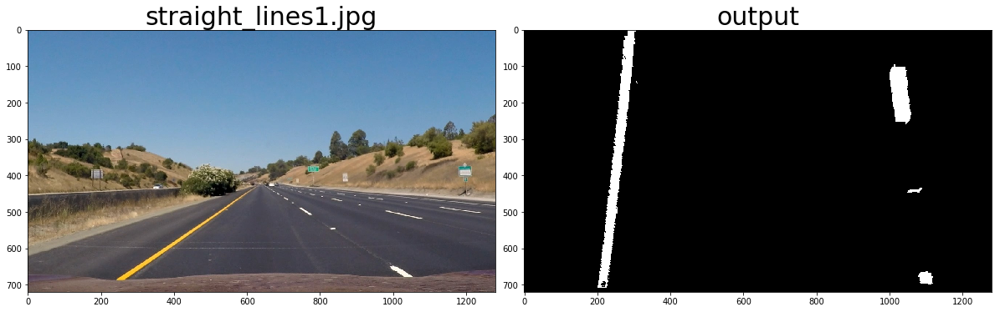

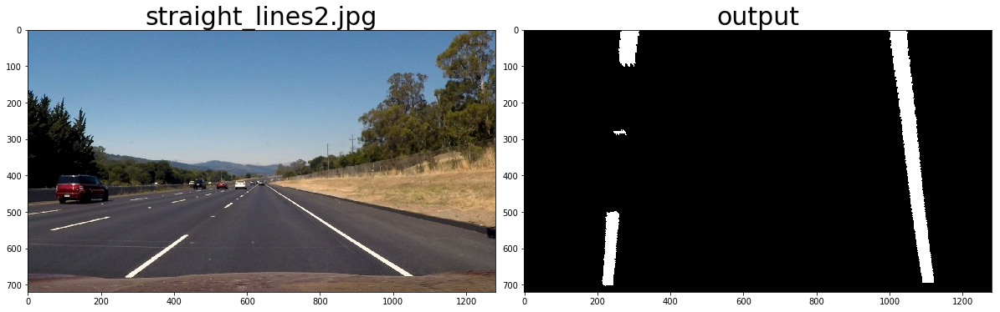

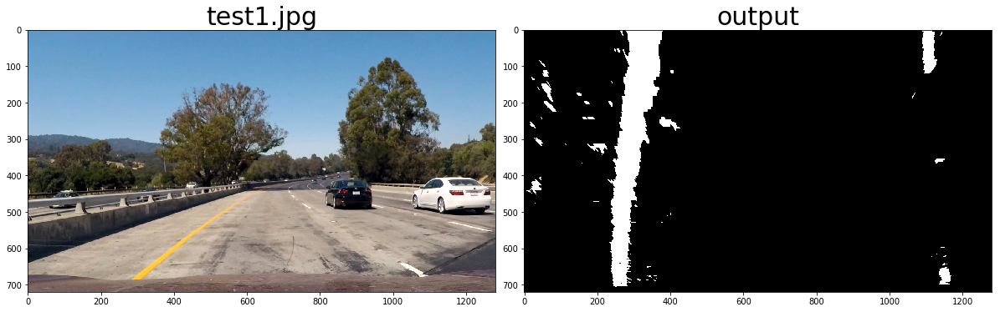

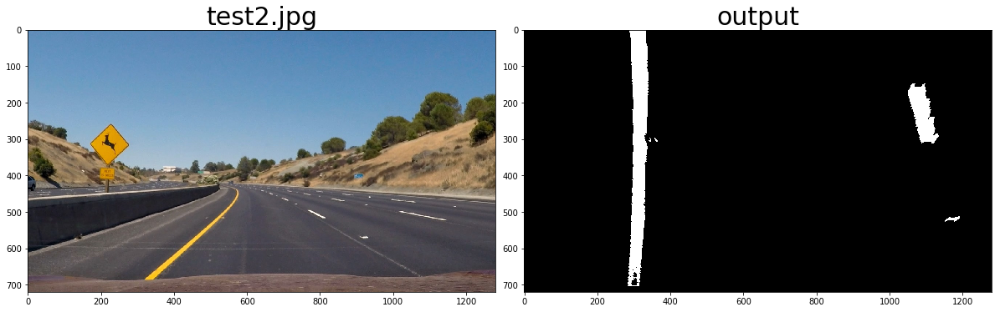

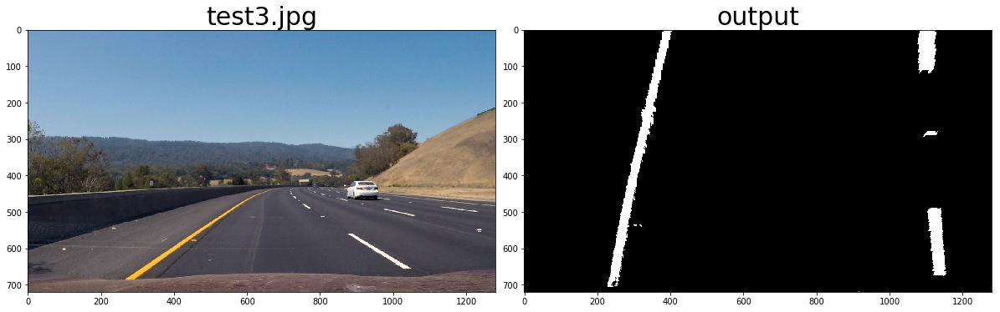

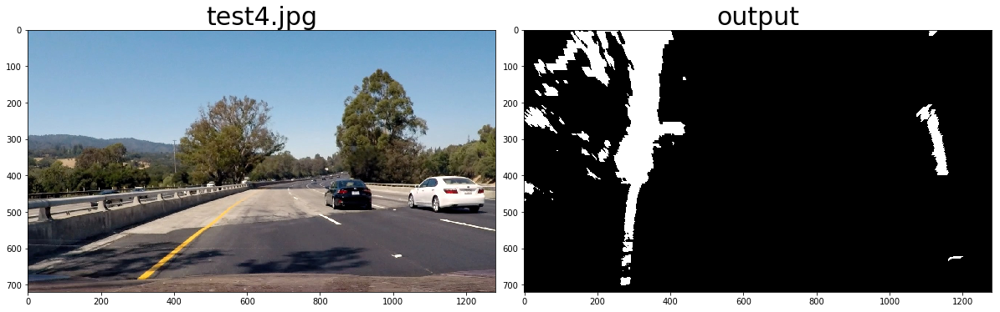

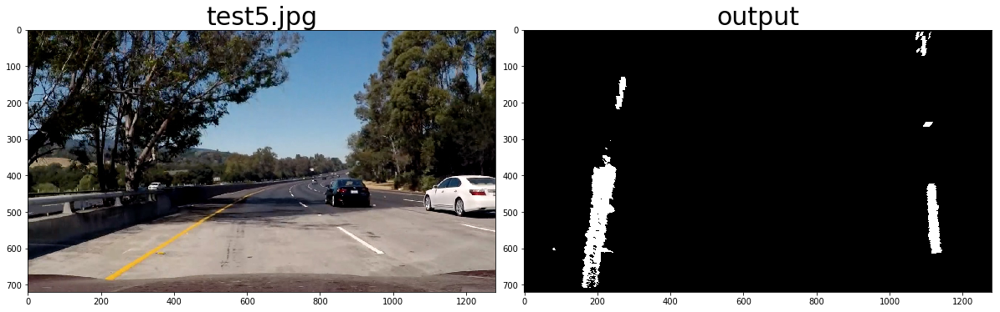

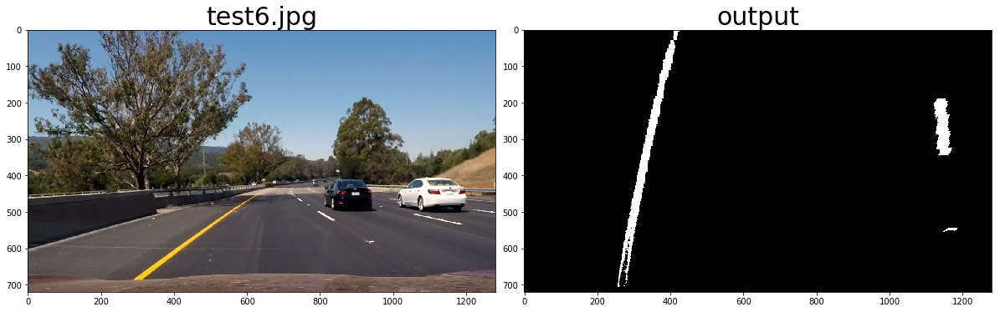

In [18]:
images1 = glob.glob('test_images/straight_lines*.jpg')
for index,file_name in enumerate(images1):
        plot_fig()

images2 = glob.glob('test_images/test*.jpg')
for index,file_name in enumerate(images2):
        plot_fig()

# Detect lane pixels and fit to find the lane boundary.

# Histogram Visualization

We can take the histogram of all the columns in the lower half of the image to see the position of lane.

(720, 1280, 3)
straight_lines1.jpg


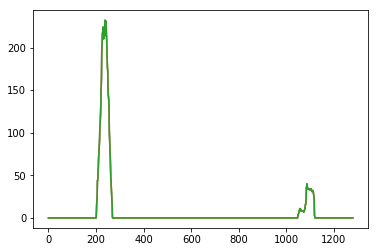

(720, 1280, 3)
straight_lines2.jpg


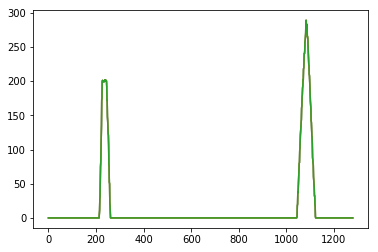

./output_images/preprocessed/test1.jpg


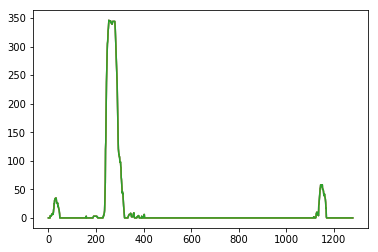

./output_images/preprocessed/test2.jpg


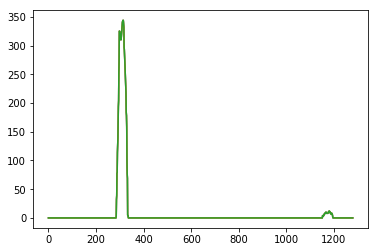

./output_images/preprocessed/test3.jpg


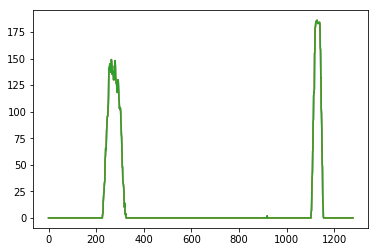

./output_images/preprocessed/test4.jpg


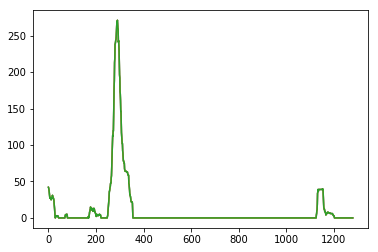

./output_images/preprocessed/test5.jpg


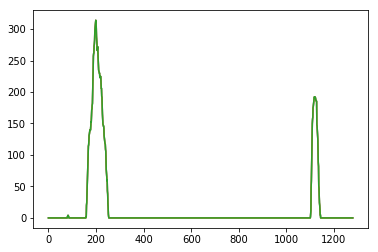

./output_images/preprocessed/test6.jpg


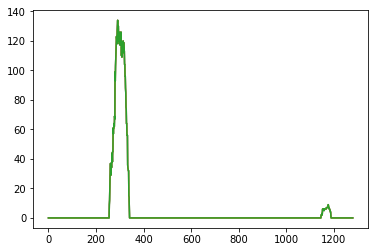

In [19]:
images1 = glob.glob('./output_images/preprocessed/straight_lines*.jpg')
for index,file_name in enumerate(images1):
        img = cv2.imread(file_name)
        print(img.shape)
        histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
        title = file_name.split('/')
        title = title[-1]
        print(title)
        plt.plot(histogram)
        plt.show()

images2 = glob.glob('./output_images/preprocessed/test*.jpg')
for index,file_name in enumerate(images2):
        img = cv2.imread(file_name)
        histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
        print(file_name)
        plt.plot(histogram)
        plt.show()

Now we can use this knowledge to start a sliding window search around the left and right lane positions, and fit a polynomial.

# Visualization of sliding window search

Processed binary image straight_lines1.jpg
windows drawn 1
left points 188 640   288 720 

right points 1036 640 1136 720 



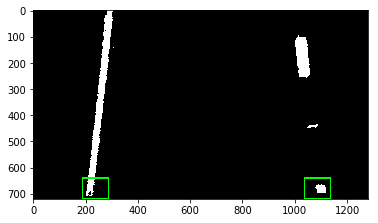

windows drawn 2
left points 168 560   268 640 

right points 1049 560 1149 640 



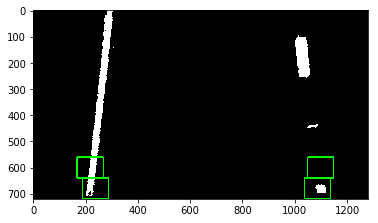

windows drawn 3
left points 178 480   278 560 

right points 1049 480 1149 560 



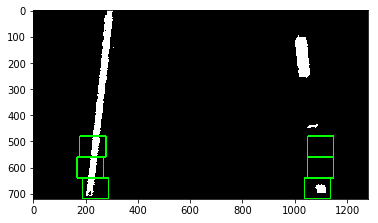

windows drawn 4
left points 187 400   287 480 

right points 1049 400 1149 480 



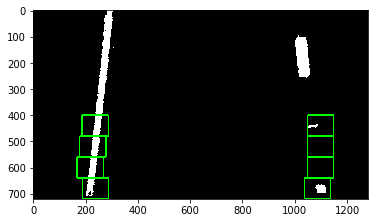

windows drawn 5
left points 195 320   295 400 

right points 1019 320 1119 400 



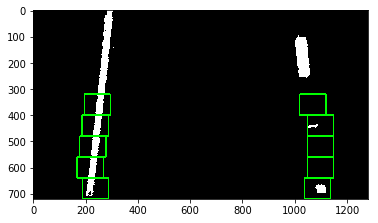

windows drawn 6
left points 205 240   305 320 

right points 1019 240 1119 320 



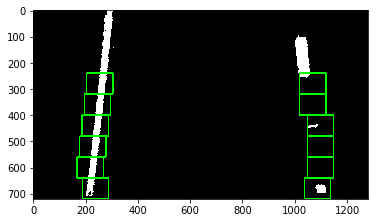

windows drawn 7
left points 214 160   314 240 

right points 987 160 1087 240 



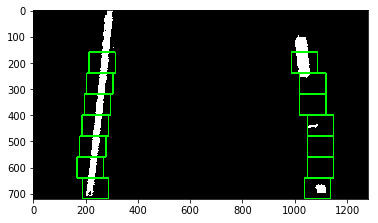

windows drawn 8
left points 222 80   322 160 

right points 981 80 1081 160 



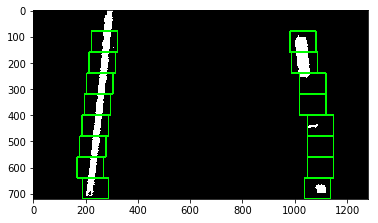

windows drawn 9
left points 230 0   330 80 

right points 974 0 1074 80 



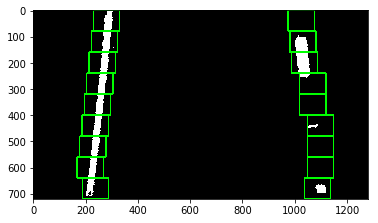

Polynomial Fit


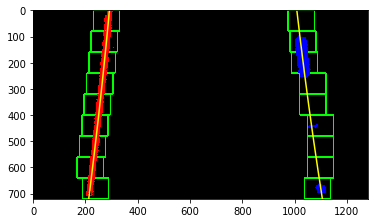

In [20]:
images1 = glob.glob('test_images/straight_lines*.jpg')
for index,file_name in enumerate(images1):
        inp = cv2.imread(file_name)
        title = file_name.split('/')
        title=title[-1]
        binary_warped,Minv = preprocess(inp)
        print("Processed binary image "+title)
#         print("shape",binary_warped.shape)
#         plt.imshow(binary_warped,cmap='gray')
#         plt.show()
        # Assuming you have created a warped binary image called "binary_warped"
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
#         print(histogram.shape)
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
#         print("shape",out_img.shape)
#         print(np.max(out_img))
#         plt.imshow(out_img)
#         plt.show()

        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]//2)
#         print(midpoint)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]//nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero_indices = binary_warped.nonzero()
        nonzeroy_indices = np.array(nonzero_indices[0])
        nonzerox_indices = np.array(nonzero_indices[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 50
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            print("windows drawn",window+1)
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
            (0,255,0), 4) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
            (0,255,0), 4) 
            plt.imshow(out_img)
            print("left points",win_xleft_low,win_y_low," ",win_xleft_high,win_y_high,'\n')
            print("right points",win_xright_low,win_y_low,win_xright_high,win_y_high,'\n')
            plt.show()
#             break

            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy_indices >= win_y_low) & (nonzeroy_indices < win_y_high) & 
            (nonzerox_indices >= win_xleft_low) &  (nonzerox_indices < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy_indices >= win_y_low) & (nonzeroy_indices < win_y_high) & 
            (nonzerox_indices >= win_xright_low) &  (nonzerox_indices  < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox_indices[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox_indices[good_right_inds]))

#         break
        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox_indices[left_lane_inds]
        lefty = nonzeroy_indices[left_lane_inds] 
        rightx = nonzerox_indices[right_lane_inds]
        righty = nonzeroy_indices[right_lane_inds] 
        
#         print(len(lefty),len(righty),len(leftx),len(rightx))
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        print("Polynomial Fit")
        out_img[nonzeroy_indices[left_lane_inds], nonzerox_indices[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy_indices[right_lane_inds], nonzerox_indices[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
        break
        

Here we can see how the sliding windows progress and a polynomial is fit on the points detected.

# Using previous frame to detect lines in the next frame

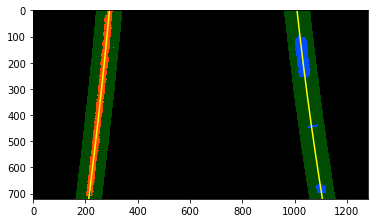

In [21]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
images1 = glob.glob('test_images/straight_lines*.jpg')
for index,file_name in enumerate(images1):
        inp = cv2.imread(file_name)
        title = file_name.split('/')
        title=title[-1]
        binary_warped,Minv = preprocess(inp)
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 50
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
        left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
        left_fit[1]*nonzeroy + left_fit[2] + margin))) 

        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
        right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
        right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                      ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                      ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.savefig("output_images/sliding_window_Search.jpg")
        break

# Measure radius of curvature and distance from centre of the lane

In [22]:
def real_world_info(img,ploty,leftx,rightx):
    # Pixels to Meters conversion
    ym_per_pix = 15/720 # meters per pixel in y dimension, 
    xm_per_pix = 5/900 # meters per pixel in x dimension, 
    
    y_eval = np.max(ploty)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    average_curverad = (left_curverad + right_curverad)/2
    
    # The offset of the lane center from the center of the image(camera mount) 
    #(converted from pixels to meters) is the distance from the center of the lane.
    car_pos = img.shape[1]/2
    centre_of_lane = (leftx[-1]+rightx[-1])/2
    offset = (car_pos - centre_of_lane)*xm_per_pix
    if offset>0:
        position = "right"
    else:
        position="left"
    return average_curverad,offset,position
    
    

In [23]:
curv,offset,pos = real_world_info(img,ploty,left_fitx,right_fitx)
print("Radius of curvature",curv,"m","\nOffset from centre",np.abs(offset),"m","to the",pos)

Radius of curvature 1398.89424178 m 
Offset from centre 0.108017737533 m to the left


Lets write a final pipeline that plots the relevant info over the lane found and handles bad frames where no lines were detected or the lanes don't make sense.

In [24]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        
        # Store values of detected pixels for a frame
        self.x_pixels = []
        self.y_pixels = []
        # Store values of past 5 fits
        self.past_fits = []
        #polynomial coefficients averaged over the last 10 iterations
        self.best_fit = None 
        #polynomial coefficients for the most recent fit
        self.current_fit = []
        #polynomial coefficients for the previous fit
        self.pr_fit = []
        #radius of curvature of the line in some units
        self.rad = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        
    def initialize_pastfits(self):
        
        # update best_fit
        for i in range(5):
            self.past_fits.append(self.current_fit)
        return None
        
        
    def update(self):
        
    
        # update pr_fit
        self.pr_fit = self.current_fit
        # update past_fits
        del self.past_fits[0]
        self.past_fits.append(self.current_fit)
        # Update best_fit
        c2=[]
        c1=[]
        c0=[]
        for i in range(5):
            c2.append(self.past_fits[i][0])
            c1.append(self.past_fits[i][1])
            c0.append(self.past_fits[i][2])
        c2_best = float(np.sum(c2)/len(c2))
        c1_best = float(np.sum(c1)/len(c1))
        c0_best = float(np.sum(c0)/len(c0))
        
        self.best_fit = [c2_best,c1_best,c0_best]
        
        return None

            
        
    

In [25]:
# Functions to be called

def sw_fit(binary_warped):
        
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]//2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]//nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero_indices = binary_warped.nonzero()
        nonzeroy_indices = np.array(nonzero_indices[0])
        nonzerox_indices = np.array(nonzero_indices[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
        margin=50
        n_windows=9

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy_indices >= win_y_low) & (nonzeroy_indices < win_y_high) & 
            (nonzerox_indices >= win_xleft_low) &  (nonzerox_indices < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy_indices >= win_y_low) & (nonzeroy_indices < win_y_high) & 
            (nonzerox_indices >= win_xright_low) &  (nonzerox_indices  < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox_indices[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox_indices[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
        
        # Again, extract left and right line pixel positions
        left_line.x_pixels = nonzerox_indices[left_lane_inds]
        left_line.y_pixels = nonzeroy_indices[left_lane_inds] 
        right_line.x_pixels = nonzerox_indices[right_lane_inds]
        right_line.y_pixels = nonzeroy_indices[right_lane_inds]
        
        
        left_fit, right_fit = (None, None) # If no good pixels were detected.
        # Fit a second order polynomial to each
        if len(left_line.x_pixels) != 0:
            left_fit = np.polyfit(left_line.y_pixels, left_line.x_pixels, 2)
        if len(right_line.x_pixels) != 0:
            right_fit = np.polyfit(right_line.y_pixels, right_line.x_pixels, 2)

        return left_fit,right_fit

    
def search_around_fit(binary_warped,left_fit,right_fit):
    
        margin=50
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
        left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
        left_fit[1]*nonzeroy + left_fit[2] + margin))) 

        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
        right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
        right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Again, extract left and right line pixel positions
        left_line.x_pixels = nonzerox[left_lane_inds]
        left_line.y_pixels = nonzeroy[left_lane_inds] 
        right_line.x_pixels = nonzerox[right_lane_inds]
        right_line.y_pixels = nonzeroy[right_lane_inds]
         
        left_fit, right_fit = (None, None) # If no good pixels were detected.
        # Fit a second order polynomial to each
        if len(left_line.x_pixels) != 0:
            left_fit = np.polyfit(left_line.y_pixels, left_line.x_pixels, 2)
        if len(right_line.x_pixels) != 0:
            right_fit = np.polyfit(right_line.y_pixels, right_line.x_pixels, 2)

        return left_fit,right_fit
    
def plot_data(org_img,binary_warped,Minv):
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_line.current_fit[0]*ploty**2 + left_line.current_fit[1]*ploty + left_line.current_fit[2]
        right_fitx = right_line.current_fit[0]*ploty**2 + right_line.current_fit[1]*ploty + right_line.current_fit[2]

        # Calculate curvature and offset
        y_eval = np.max(ploty)
        ym_per_pix = 15/720 # meters per pixel in y dimension, 
        xm_per_pix = 5/900 # meters per pixel in x dimension,
        
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(left_line.y_pixels*ym_per_pix, left_line.x_pixels*xm_per_pix, 2)
        right_fit_cr = np.polyfit(right_line.y_pixels*ym_per_pix, right_line.x_pixels*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_line.rad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_line.rad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Averaged radius of both curvatures 
        average_rad = (left_line.rad + right_line.rad)//2

        # The offset of the lane center from the center of the image(camera mount) 
        #(converted from pixels to meters) is the distance from the center of the lane.
        car_pos = binary_warped.shape[1]/2
        centre_of_lane = (left_fitx[-1]+right_fitx[-1])/2
        offset = (car_pos - centre_of_lane)*xm_per_pix
        if offset>0:
            position = "right"
        else:
            position="left"

        offset = np.abs(offset)


        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(out_img, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(out_img, Minv, (binary_warped.shape[1], binary_warped.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(org_img, 1, newwarp, 0.3, 0)

        # Plot radius of curvature and offset.
        curv_str = 'Road Curvature: ' + str(average_rad) + ' m.'
        offset_str = 'Offset: '+'{:04.3f}'.format(offset) + 'm to the '+ position +'.'
        cv2.putText(result,curv_str , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,0,0), thickness=2)
        cv2.putText(result, offset_str, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,0,0), thickness=2)

        return result
    
def check_act():
    
            # Check if there are None variables in fit.
            if len((left_line.current_fit.nonzero()))<1 or len((right_line.current_fit.nonzero()))<1:
                # use best_fit values for plotting
                left_line.current_fit = left_line.best_fit
                right_line.current_fit = right_line.best_fit
                # Generate x and y values for plotting
                plotted_image = plot_data(org_img,binary_warped,Minv)
                # update stuff to process next frame.
                left_line.detected = True
                right_line.detected = True
                left_line.update()
                right_line.update()
                return plotted_image

            else:
                left_line.detected = True
                right_line.detected = True
                # Generate x and y values for plotting
                plotted_image = plot_data(org_img,binary_warped,Minv)
                # update stuff to process next frame.
                left_line.update()
                right_line.update()
                return plotted_image

In [26]:

def process_vid(img):
    
    org_img = np.copy(img)
    # Preprocess the image by undistorting,color and gradient thresholding, and warping
    binary_warped,Minv = preprocess(org_img)
    
    if not left_line.detected and not right_line.detected:
        left_line.current_fit, right_line.current_fit = sw_fit(binary_warped)
        left_line.initialize_pastfits()
        right_line.initialize_pastfits()
        # Check function
        # Check if there are None variables in fit.
        if len((left_line.current_fit.nonzero()))<1 or len((right_line.current_fit.nonzero()))<1:
            # use best_fit values for plotting
            left_line.current_fit = left_line.best_fit
            right_line.current_fit = right_line.best_fit
            # Generate x and y values for plotting
            plotted_image = plot_data(org_img,binary_warped,Minv)
            # update stuff to process next frame.
            left_line.detected = True
            right_line.detected = True
            left_line.update()
            right_line.update()
            return plotted_image

        else:
            left_line.detected = True
            right_line.detected = True
            # Generate x and y values for plotting
            plotted_image = plot_data(org_img,binary_warped,Minv)
            # update stuff to process next frame.
            left_line.update()
            right_line.update()
            return plotted_image

    else:
        left_line.current_fit,right_line.current_fit = search_around_fit(binary_warped,left_line.pr_fit,right_line.pr_fit)
        # Check if there are None variables in fit.
        if len((left_line.current_fit.nonzero()))<1 or len((right_line.current_fit.nonzero()))<1:
            # search around the best fit
            left_line.current_fit,right_line.current_fit = search_around_fit(binary_warped,left_line.best_fit,right_line.best_fit)
            # Check for None values and decide
            # Check if there are None variables in fit.
            if len((left_line.current_fit.nonzero()))<1 or len((right_line.current_fit.nonzero()))<1:
                # use best_fit values for plotting
                left_line.current_fit = left_line.best_fit
                right_line.current_fit = right_line.best_fit
                # Generate x and y values for plotting
                plotted_image = plot_data(org_img,binary_warped,Minv)
                # update stuff to process next frame.
                left_line.detected = True
                right_line.detected = True
                left_line.update()
                right_line.update()
                return plotted_image

            else:
                left_line.detected = True
                right_line.detected = True
                # Generate x and y values for plotting
                plotted_image = plot_data(org_img,binary_warped,Minv)
                # update stuff to process next frame.
                left_line.update()
                right_line.update()
                return plotted_image

        else:
            # Generate x and y values for plotting
            plotted_image = plot_data(org_img,binary_warped,Minv)
            left_line.detected = True
            right_line.detected = True
            # update stuff to process next frame.
            left_line.update()
            right_line.update()
            return plotted_image


In [27]:
# Import everything needed to edit/save/watch video clips
import os
from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Project video

In [28]:
left_line = Line()
right_line= Line()
output = 'output_video1.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip_out = VideoFileClip("project_video.mp4")
clip_in = clip_out.fl_image(process_vid) #NOTE: this function expects color images!!
%time clip_in.write_videofile(output, audio=False)





[MoviePy] >>>> Building video output_video1.mp4
[MoviePy] Writing video output_video1.mp4


100%|█████████▉| 1260/1261 [03:11<00:00,  6.27it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video1.mp4 

CPU times: user 3min 6s, sys: 48.4 s, total: 3min 55s
Wall time: 3min 12s


In [29]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

The pipeline accurately trackes the lane lines. The performance is satisfactory.

## Challenge Video

In [31]:
left_line = Line()
right_line= Line()
output = 'output_challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip_out = VideoFileClip("challenge_video.mp4")
clip_in = clip_out.fl_image(process_vid) #NOTE: this function expects color images!!
%time clip_in.write_videofile(output, audio=False)


HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))


[MoviePy] >>>> Building video output_challenge.mp4
[MoviePy] Writing video output_challenge.mp4


  8%|▊         | 39/485 [00:05<01:03,  7.03it/s]

AttributeError: 'NoneType' object has no attribute 'nonzero'

The pipeline does not handle bad frames as expected. The pixels are not detected by the gradient and color thresholds.

## Harder Challenge Video

In [32]:
left_line = Line()
right_line= Line()
output = 'output_harder_challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip_out = VideoFileClip("harder_challenge_video.mp4")
clip_in = clip_out.fl_image(process_vid) #NOTE: this function expects color images!!
%time clip_in.write_videofile(output, audio=False)


HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))


[MoviePy] >>>> Building video output_harder_challenge.mp4
[MoviePy] Writing video output_harder_challenge.mp4



 25%|██▌       | 303/1200 [00:53<02:28,  6.03it/s]


 26%|██▋       | 316/1200 [00:55<02:12,  6.68it/s]


AttributeError: 'NoneType' object has no attribute 'nonzero'

The pipeline does not handle bad frames as expected. The pixels are not detected by the gradient and color thresholds.